In [2]:
import os
import random
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# ===========================
# 1. HÀM ĐỌC DỮ LIỆU
# ===========================

def load_dataset_info(root_dir):
    class_names = sorted(os.listdir(root_dir))
    data_info = {}

    for cls in class_names:
        cls_path = os.path.join(root_dir, cls)
        if not os.path.isdir(cls_path): 
            continue

        images = [os.path.join(cls_path, img) for img in os.listdir(cls_path)
                  if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

        data_info[cls] = images

    return data_info


# Đường dẫn thư mục
train_dir = r"E:\archive\SkinDisease\SkinDisease\train"
test_dir = r"E:\archive\SkinDisease\SkinDisease\test"

train_data = load_dataset_info(train_dir)
test_data  = load_dataset_info(test_dir)

print("Số lớp:", len(train_data))
print("Danh sách lớp:", list(train_data.keys()))
print(f"Số ảnh train: {sum(len(v) for v in train_data.values())}")
print(f"Số ảnh test:  {sum(len(v) for v in test_data.values())}")


Số lớp: 22
Danh sách lớp: ['Acne', 'Actinic_Keratosis', 'Benign_tumors', 'Bullous', 'Candidiasis', 'DrugEruption', 'Eczema', 'Infestations_Bites', 'Lichen', 'Lupus', 'Moles', 'Psoriasis', 'Rosacea', 'Seborrh_Keratoses', 'SkinCancer', 'Sun_Sunlight_Damage', 'Tinea', 'Unknown_Normal', 'Vascular_Tumors', 'Vasculitis', 'Vitiligo', 'Warts']
Số ảnh train: 13898
Số ảnh test:  1333


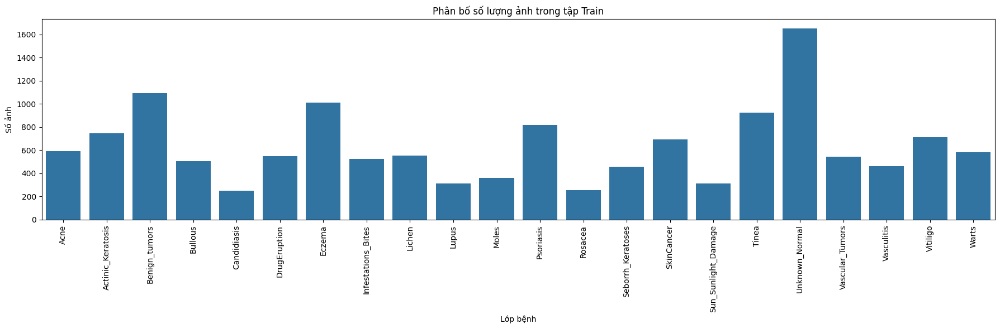

In [3]:
# Chuẩn bị dữ liệu
class_names = list(train_data.keys())
counts = [len(train_data[c]) for c in class_names]

plt.figure(figsize=(18, 6))
sns.barplot(x=class_names, y=counts)
plt.xticks(rotation=90)
plt.title("Phân bố số lượng ảnh trong tập Train")
plt.xlabel("Lớp bệnh")
plt.ylabel("Số ảnh")
plt.tight_layout()
plt.show()


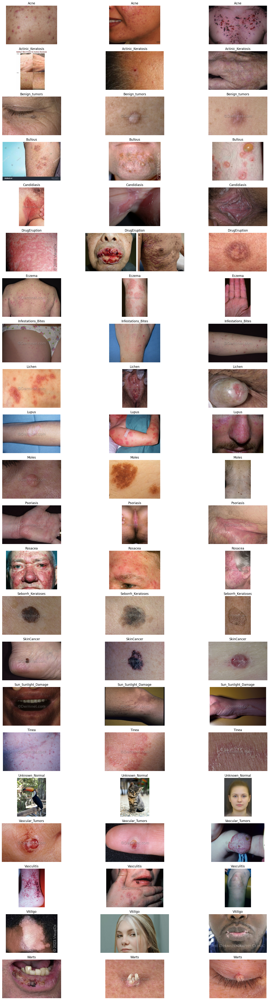

In [4]:
def show_sample_images(data_info, samples_per_class=3):
    classes = list(data_info.keys())
    num_classes = len(classes)

    plt.figure(figsize=(18, num_classes * 2.5))

    img_id = 1
    for cls in classes:
        imgs = data_info[cls]
        chosen_imgs = random.sample(imgs, min(len(imgs), samples_per_class))

        for img_path in chosen_imgs:
            plt.subplot(num_classes, samples_per_class, img_id)
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis("off")
            plt.title(cls)
            img_id += 1

    plt.tight_layout()
    plt.show()

# Gọi hàm:
show_sample_images(train_data, samples_per_class=3)


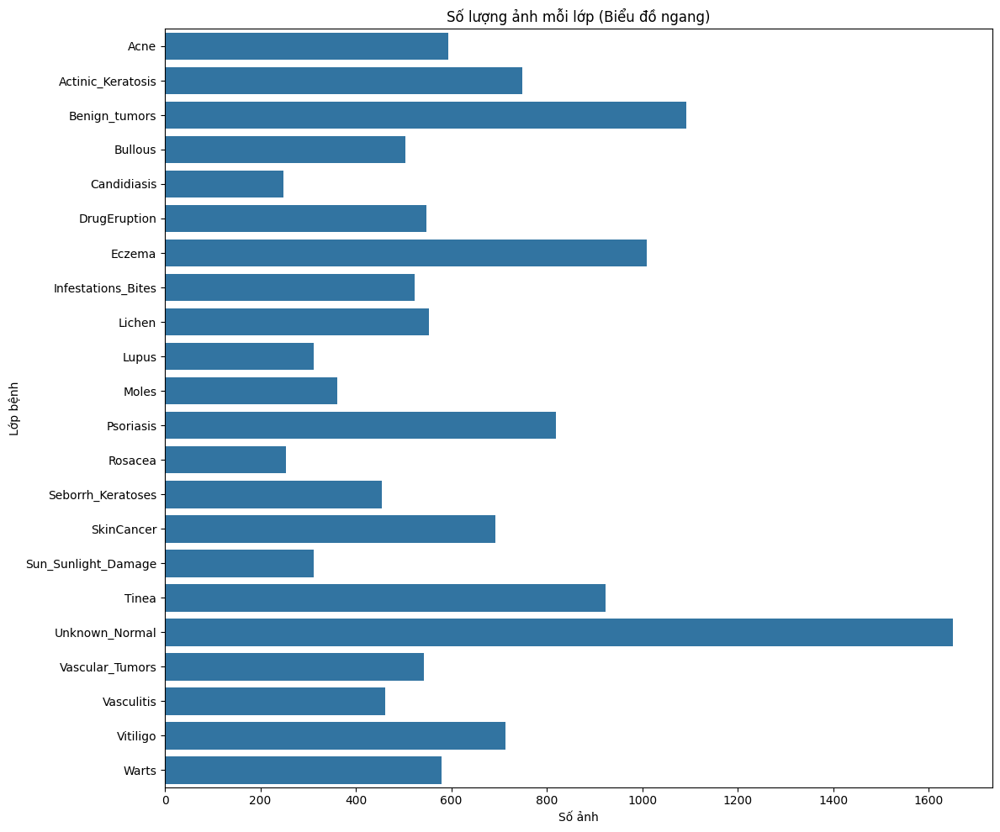

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

class_names = list(train_data.keys())
counts = [len(train_data[c]) for c in class_names]

plt.figure(figsize=(12, 10))
sns.barplot(y=class_names, x=counts)
plt.title("Số lượng ảnh mỗi lớp (Biểu đồ ngang)")
plt.xlabel("Số ảnh")
plt.ylabel("Lớp bệnh")
plt.tight_layout()
plt.show()


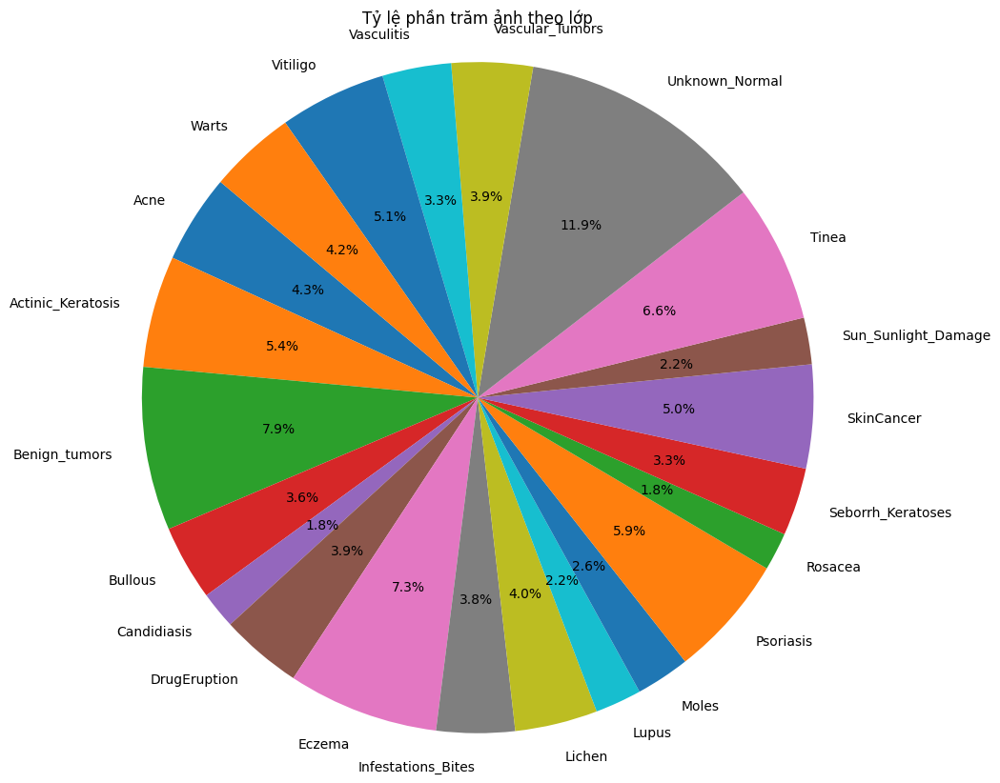

In [6]:
plt.figure(figsize=(10, 10))
plt.pie(counts, labels=class_names, autopct='%1.1f%%', startangle=140)
plt.title("Tỷ lệ phần trăm ảnh theo lớp")
plt.axis('equal')
plt.show()


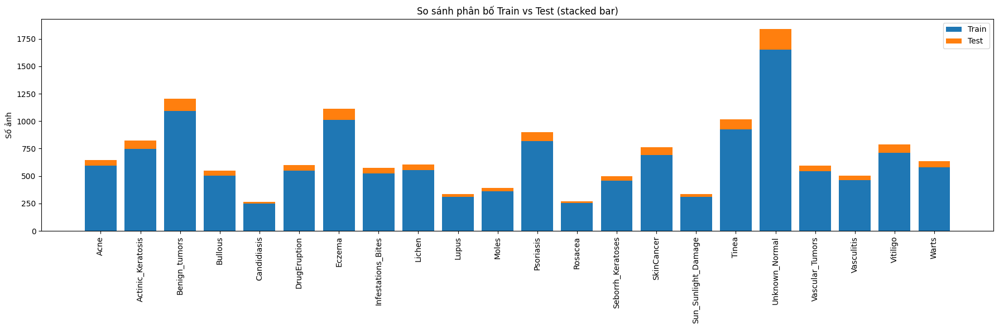

In [7]:
test_counts = [len(test_data[c]) for c in class_names]

import numpy as np
x = np.arange(len(class_names))

plt.figure(figsize=(18, 6))
plt.bar(x, counts, label="Train")
plt.bar(x, test_counts, bottom=counts, label="Test")

plt.xticks(x, class_names, rotation=90)
plt.ylabel("Số ảnh")
plt.title("So sánh phân bố Train vs Test (stacked bar)")
plt.legend()
plt.tight_layout()
plt.show()


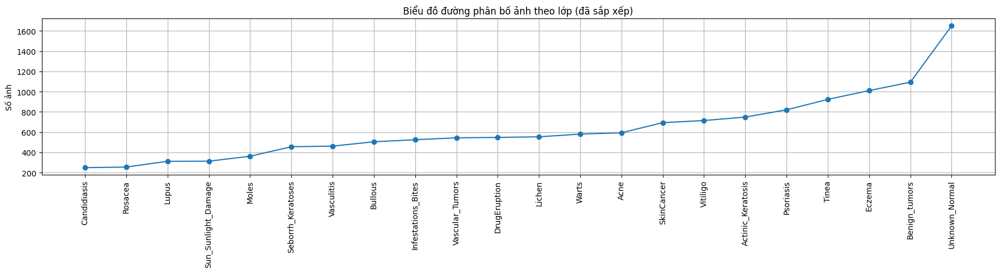

In [8]:
sorted_pairs = sorted(zip(class_names, counts), key=lambda x: x[1])
sorted_names, sorted_counts = zip(*sorted_pairs)

plt.figure(figsize=(18, 5))
plt.plot(sorted_names, sorted_counts, marker='o')
plt.xticks(rotation=90)
plt.title("Biểu đồ đường phân bố ảnh theo lớp (đã sắp xếp)")
plt.ylabel("Số ảnh")
plt.grid(True)
plt.tight_layout()
plt.show()


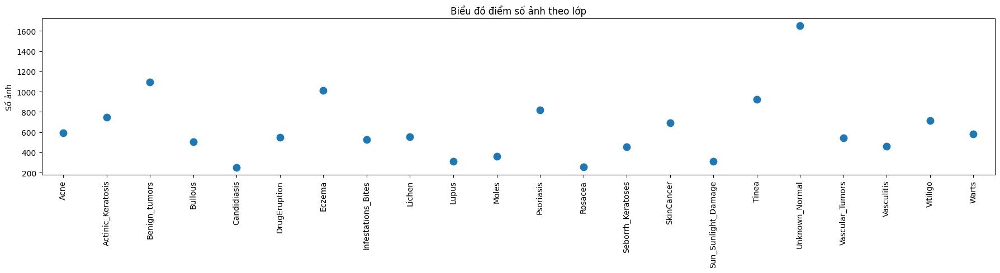

In [9]:
plt.figure(figsize=(18, 5))
sns.stripplot(x=class_names, y=counts, size=10)
plt.xticks(rotation=90)
plt.title("Biểu đồ điểm số ảnh theo lớp")
plt.ylabel("Số ảnh")
plt.tight_layout()
plt.show()


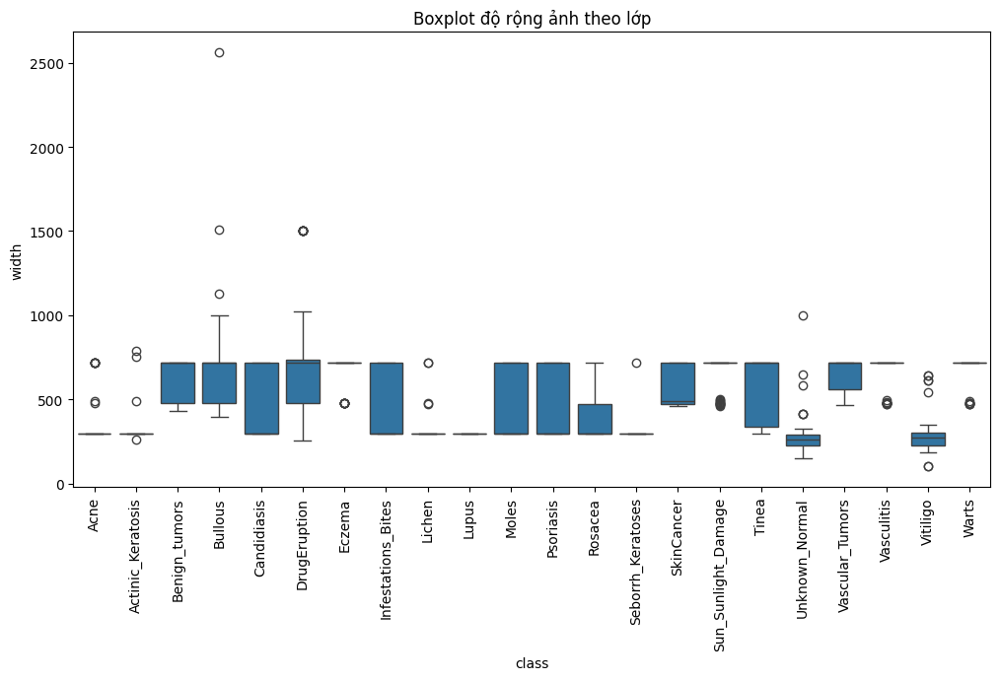

In [10]:
from PIL import Image

image_sizes = []

for cls, paths in train_data.items():
    for path in paths[:50]:  # tránh quá nhiều ảnh
        img = Image.open(path)
        image_sizes.append({
            "class": cls,
            "width": img.width,
            "height": img.height
        })

import pandas as pd
df = pd.DataFrame(image_sizes)

plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="class", y="width")
plt.xticks(rotation=90)
plt.title("Boxplot độ rộng ảnh theo lớp")
plt.show()



[notice] A new release of pip available: 22.3.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


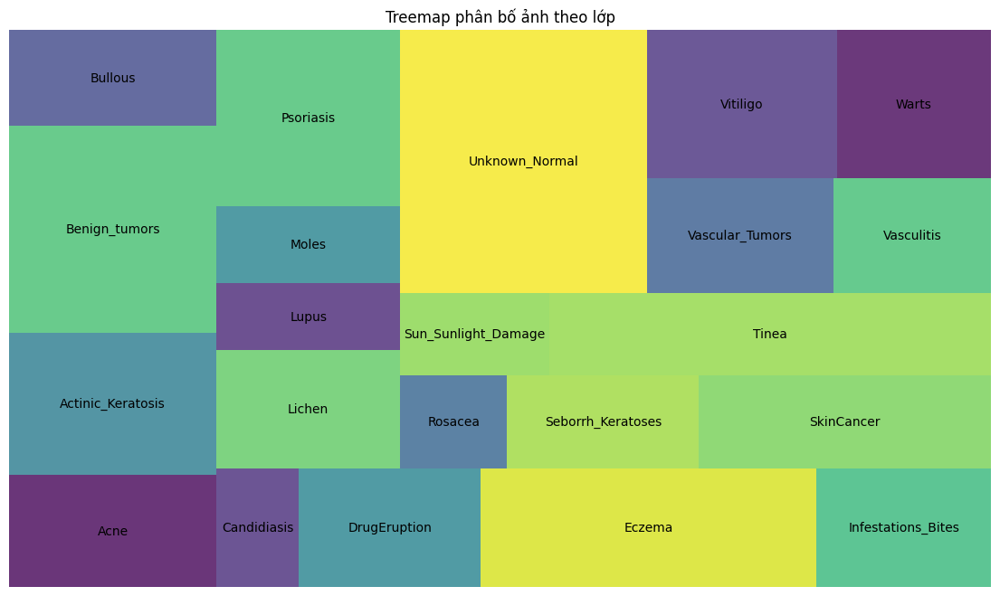

In [11]:
!pip install squarify
import squarify

plt.figure(figsize=(14, 8))
squarify.plot(sizes=counts, label=class_names, alpha=0.8)
plt.axis('off')
plt.title("Treemap phân bố ảnh theo lớp")
plt.show()


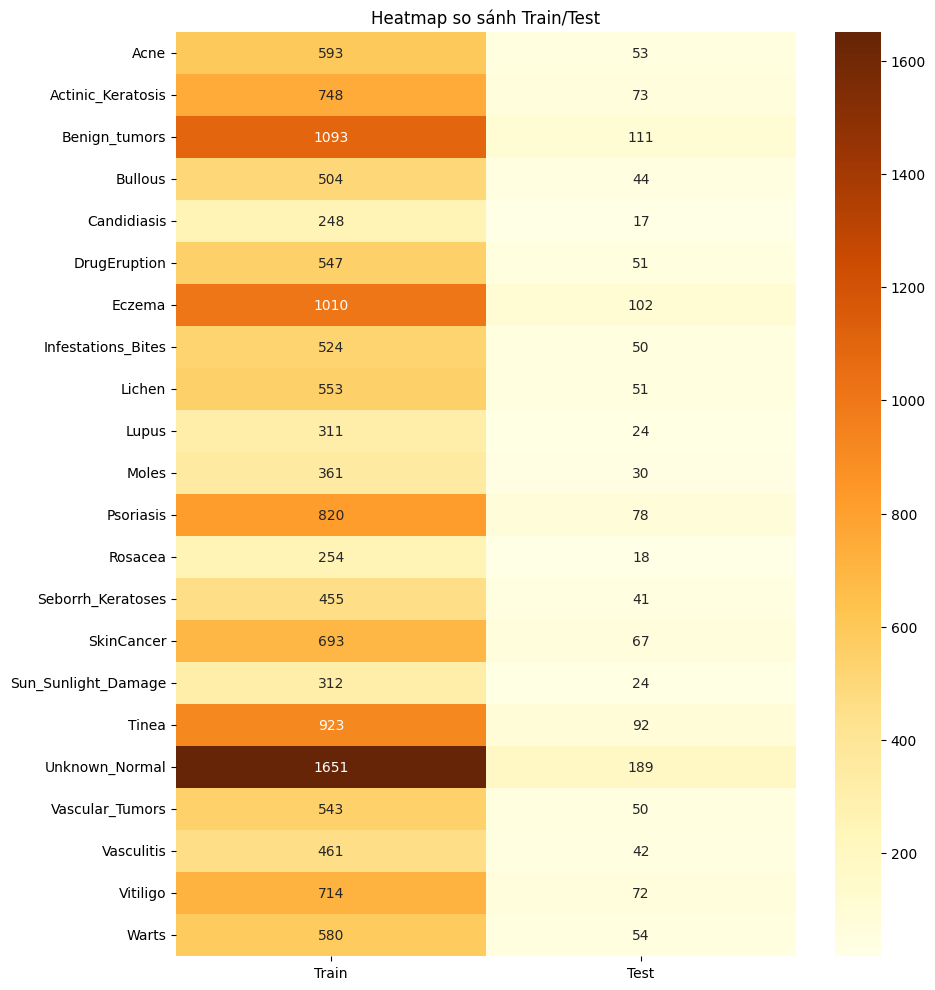

In [12]:
import numpy as np
import pandas as pd
train_counts = np.array([len(train_data[c]) for c in class_names])
test_counts  = np.array([len(test_data[c]) for c in class_names])

df = pd.DataFrame({
    "Train": train_counts,
    "Test": test_counts
}, index=class_names)

plt.figure(figsize=(10, 12))
sns.heatmap(df, annot=True, fmt="d", cmap="YlOrBr")
plt.title("Heatmap so sánh Train/Test")
plt.show()
